In [1]:
source("Main.R")
source("Conf.R")
source("Utilities.R")
source("DAVID_query.R")
library("factoextra")
library("maptree")
library("ggpubr")
library(NMF)

library(repr)
fileDir = "/home/beraslan/jovian-work/analysisSingle/"
geneCutOff=4
targetCutOff=13

corrplot 0.84 loaded


********************************************************

Note: As of version 1.0.0, cowplot does not change the

  default ggplot2 theme anymore. To recover the previous

  behavior, execute:
  theme_set(theme_cowplot())

********************************************************



Attaching package: ‘pls’


The following object is masked from ‘package:corrplot’:

    corrplot


The following object is masked from ‘package:stats’:

    loadings


Loading required package: AnnotationDbi

Loading required package: stats4

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following o

In [2]:
coefsAll <- read.csv("/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_SignificantBetaCoefs.csv", row.names = 1)
pValsAll <- read.csv("/home/beraslan/jovian-work/analysisSingle/MixedEffectLMOutputs/ME_AdjustedPValues.csv", row.names = 1)

In [3]:
dim(coefsAll)

[1]  329 1041

In [4]:
M_g = cor((coefsAll), method = "pearson")
diag(M_g) <- 0

In [5]:
dim(M_g)

[1] 1041 1041

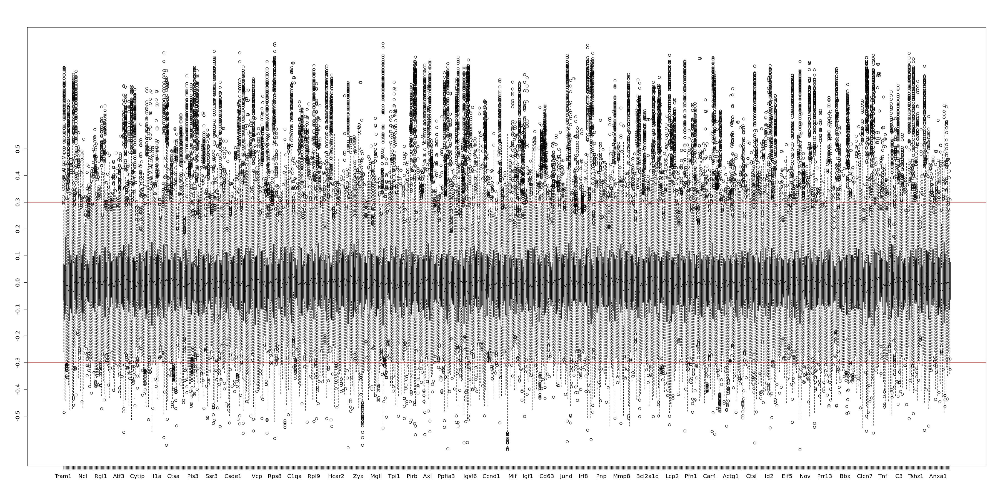

In [6]:
options(repr.plot.width=30, repr.plot.height=15)
boxplot(M_g)
abline(h=0.3, col="red")
abline(h= -0.3, col="red")
axis(2, at = seq(-0.5,0.5,0.1))

In [7]:
options(repr.plot.width=17, repr.plot.height=16)

M1 <- M_g
M1[M1>0.5] = 0.5
M1[M1 < -0.5] = -0.5

In [8]:
deneme <- prcomp(M1,rank. = 15)

In [9]:
summary(deneme)

Importance of first k=15 (out of 1041) components:
                          PC1    PC2    PC3     PC4     PC5     PC6     PC7
Standard deviation     2.6743 2.2245 1.4940 1.15048 0.89794 0.78112 0.65178
Proportion of Variance 0.3439 0.2379 0.1073 0.06364 0.03877 0.02934 0.02043
Cumulative Proportion  0.3439 0.5818 0.6891 0.75277 0.79154 0.82087 0.84130
                          PC8    PC9    PC10    PC11    PC12   PC13   PC14
Standard deviation     0.5964 0.5473 0.47560 0.38724 0.36620 0.3413 0.3160
Proportion of Variance 0.0171 0.0144 0.01088 0.00721 0.00645 0.0056 0.0048
Cumulative Proportion  0.8584 0.8728 0.88368 0.89089 0.89734 0.9029 0.9077
                          PC15
Standard deviation     0.30017
Proportion of Variance 0.00433
Cumulative Proportion  0.91207

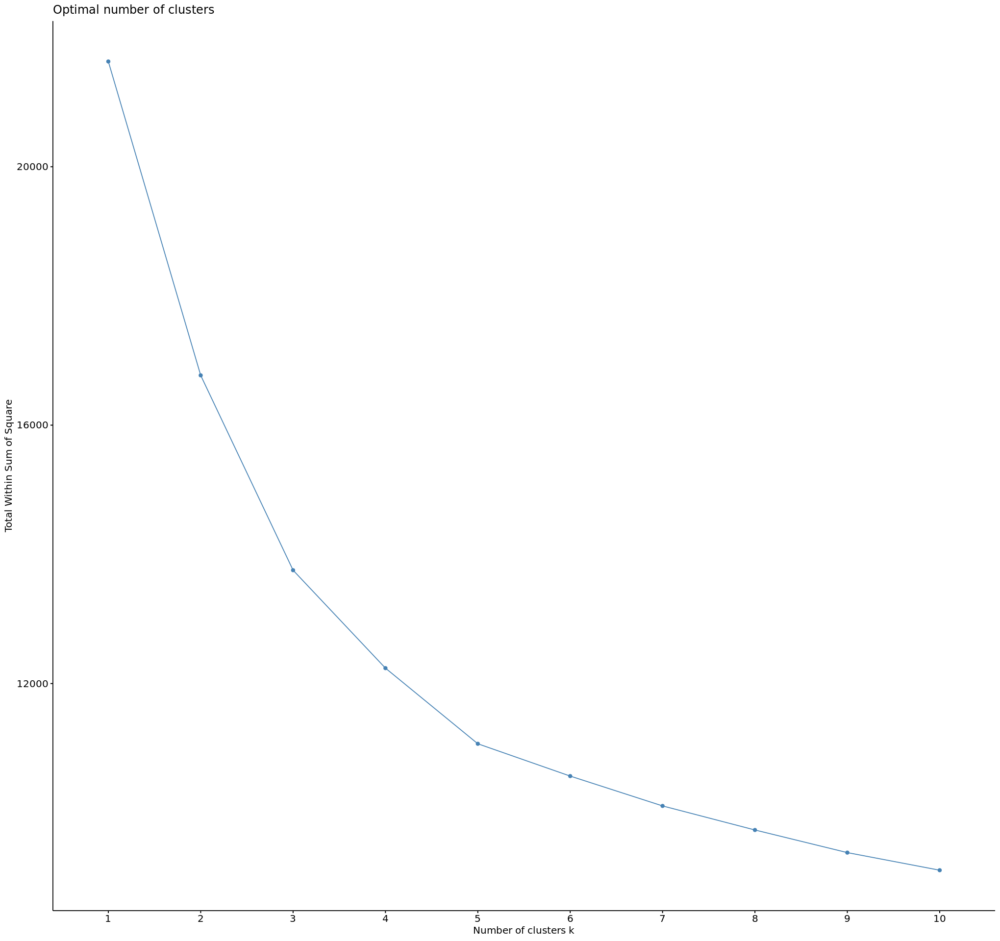

In [10]:
fviz_nbclust(M1, kmeans, method = "wss")


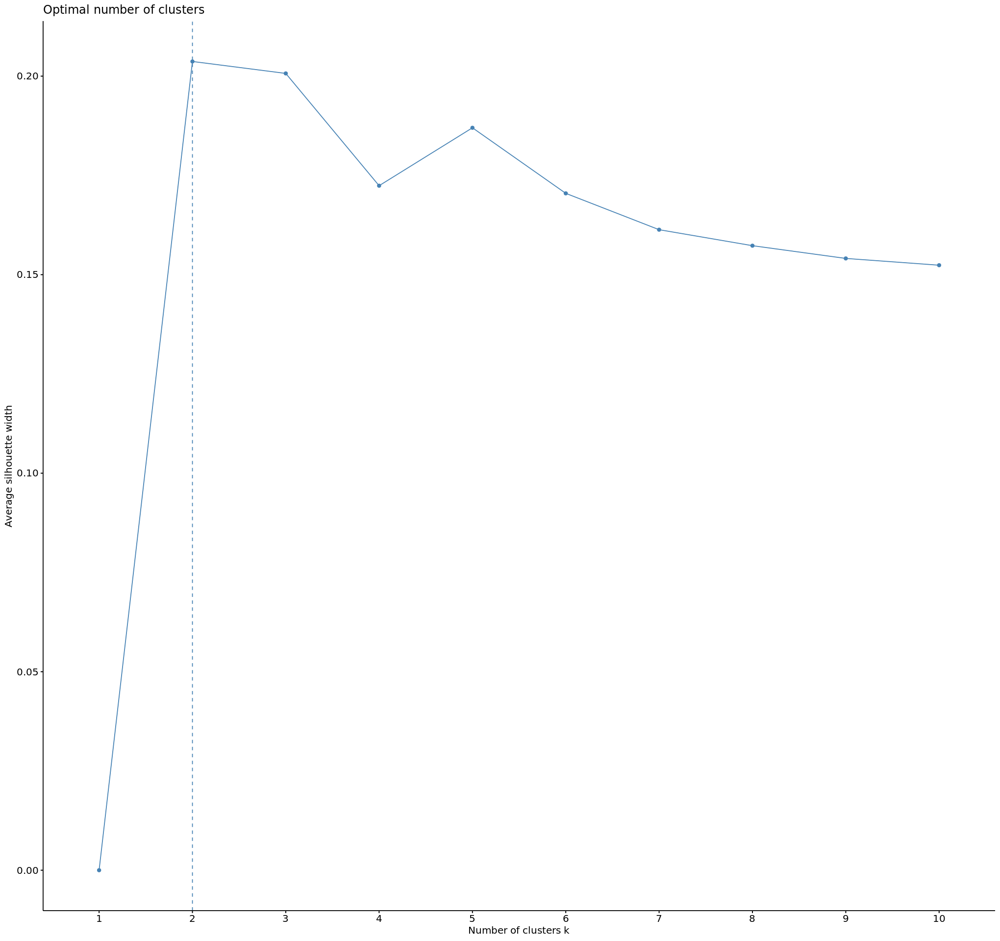

In [11]:
fviz_nbclust(M1, kmeans, method = "silhouette")


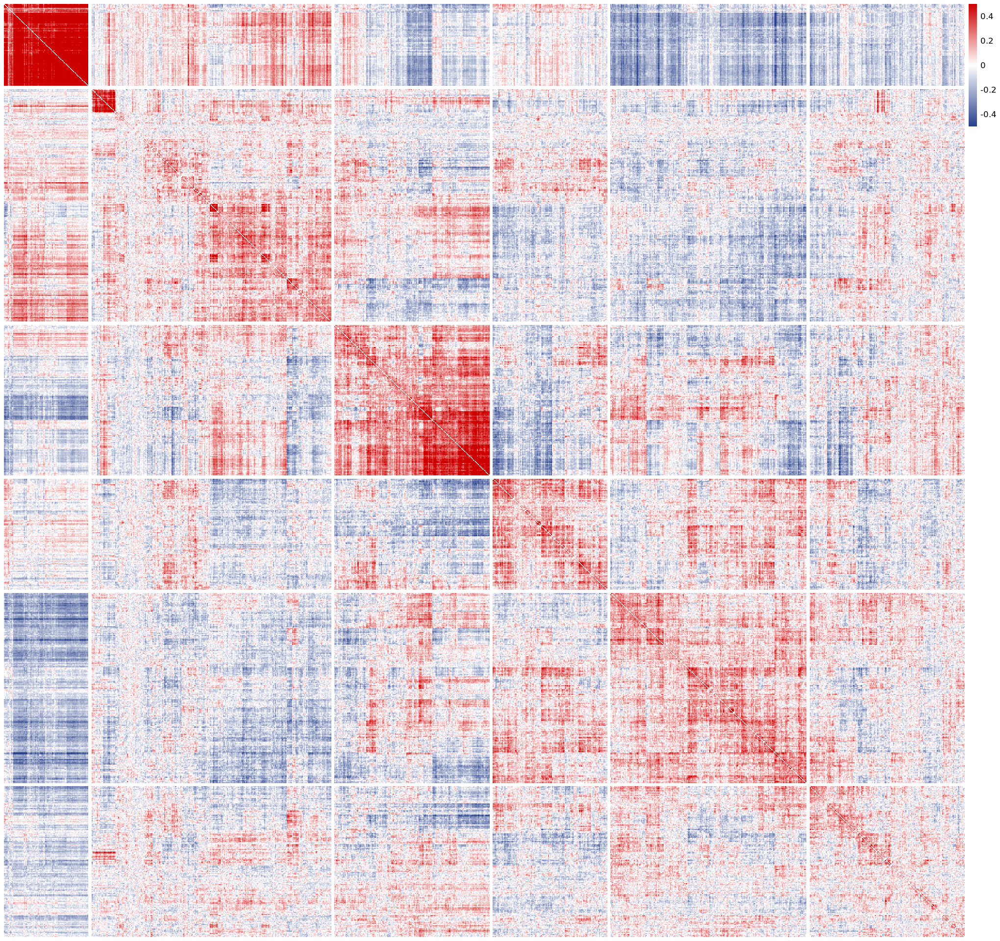

In [12]:
hm1 <- pheatmap(M1,show_rownames = FALSE, show_colnames = FALSE,
                treeheight_row = 0, treeheight_col = 0,
                cutree_rows = 6, cutree_cols  = 6,
                color=colorRampPalette(c("royalblue4","white","red3"))(200),
                clustering_method="ward.D2", 
                clustering_distance_rows="euclidean",
                clustering_distance_cols="euclidean" )


[1] 6

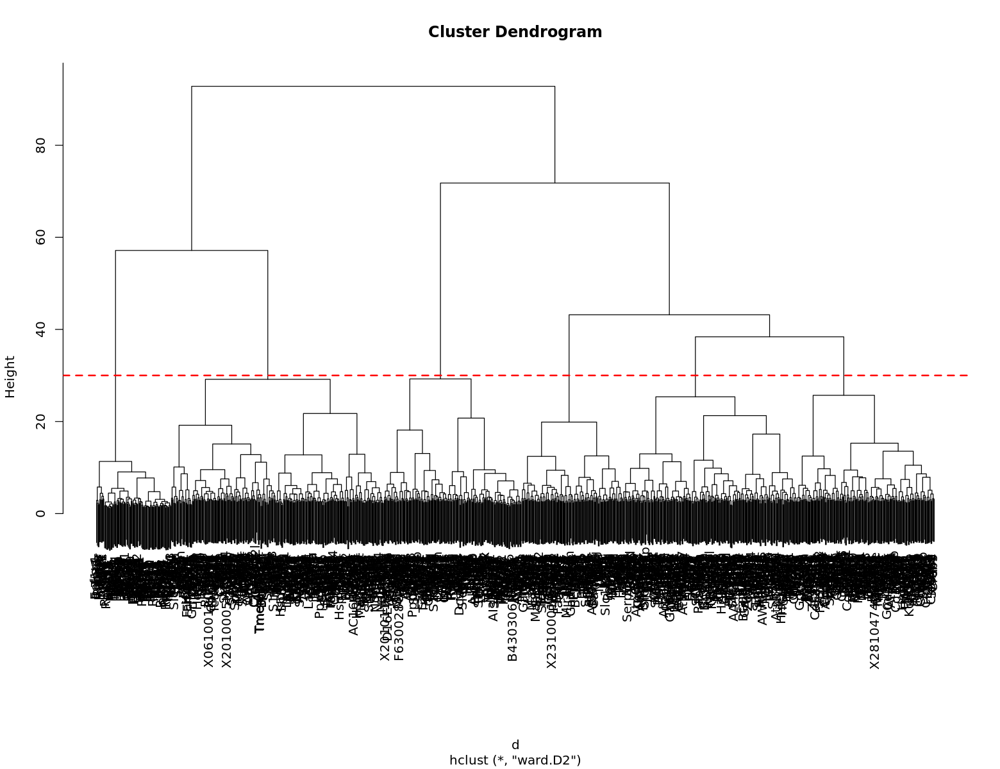

In [13]:
#ctree=2
ctree=30

options(repr.plot.width=13, repr.plot.height=10)

plot(hm1$tree_row)
abline(h=ctree, col="red", lty=2, lwd=2)
geneClusters <- cutree(hm1$tree_ro, h=ctree)
length(unique(geneClusters))


In [14]:
unique(geneClusters[hm1$tree_row$order])

[1] 2 1 4 5 3 6

In [15]:
geneModules <- data.frame(GeneName=names(geneClusters[hm1$tree_row$order]),
                          GeneGroup=factor(geneClusters[hm1$tree_row$order]), stringsAsFactors = F)
rownames(geneModules) <- names(geneClusters[hm1$tree_row$order])

In [16]:
head(geneModules)

,GeneName,GeneGroup
,<chr>,<fct>
Eef1a1,Eef1a1,2
Tpt1,Tpt1,2
Rps27,Rps27,2
Rplp0,Rplp0,2
Denr,Denr,2
Hmgb2,Hmgb2,2


In [24]:
geneModulesN <- rbind(geneModules[geneModules$GeneGroup=="2",], geneModules[geneModules$GeneGroup=="1",] ) 
geneModulesN <- rbind(geneModulesN, geneModules[geneModules$GeneGroup=="4",])
geneModulesN <- rbind(geneModulesN, geneModules[geneModules$GeneGroup=="5",])
geneModulesN <- rbind(geneModulesN, geneModules[geneModules$GeneGroup=="6",])
geneModulesN <- rbind(geneModulesN, geneModules[geneModules$GeneGroup=="3",])

In [25]:
head(geneModulesN)

,GeneName,GeneGroup
,<chr>,<fct>
Eef1a1,Eef1a1,2
Tpt1,Tpt1,2
Rps27,Rps27,2
Rplp0,Rplp0,2
Denr,Denr,2
Hmgb2,Hmgb2,2


In [26]:
tp <- split(geneModulesN, f = geneModulesN$GeneGroup)
tpDat = data.frame(matrix("", nrow = max(table(geneModules)), ncol=length(tp)), stringsAsFactors = FALSE)

for(elem in 1:length(tp)){
    tpDat[1:length(tp[[elem]]$GeneName),elem] <- as.character(tp[[elem]]$GeneName)
}

colnames(tpDat) <- paste0("GeneModule_",names(tp))

In [27]:
head(tpDat)

,GeneModule_1,GeneModule_2,GeneModule_3,GeneModule_4,GeneModule_5,GeneModule_6
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,Chil3,Eef1a1,Spp1,Unc119,Icam1,Sgk1
2,Ak4,Tpt1,Ctsl,Glrx,Ccrl2,Lhfpl2
3,Bnip3l,Rps27,Mt1,Flna,Tnfaip2,Sdcbp
4,Pfkl,Rplp0,Alcam,X2010111I01Rik,Tlr2,Lrp12
5,Pdk1,Denr,Ctsa,Tmsb4x,Gadd45a,Cd9
6,Slc16a3,Hmgb2,Sdc3,Pitpna,Nfkbiz,Gpr137b


In [28]:
write.csv(geneModulesN, "/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_6_Modules.csv", quote = F)
write.csv(tpDat, "/home/beraslan/jovian-work/analysisSingle/ME_GeneModules_6_Modules_wide.csv", quote = F, )


In [73]:
geneModulesN

,GeneName,GeneGroup
,<chr>,<fct>
Eef1a1,Eef1a1,2
Tpt1,Tpt1,2
Rps27,Rps27,2
Rplp0,Rplp0,2
Denr,Denr,2
Hmgb2,Hmgb2,2
Eif3f,Eif3f,2
Eif3e,Eif3e,2
Eif3k,Eif3k,2


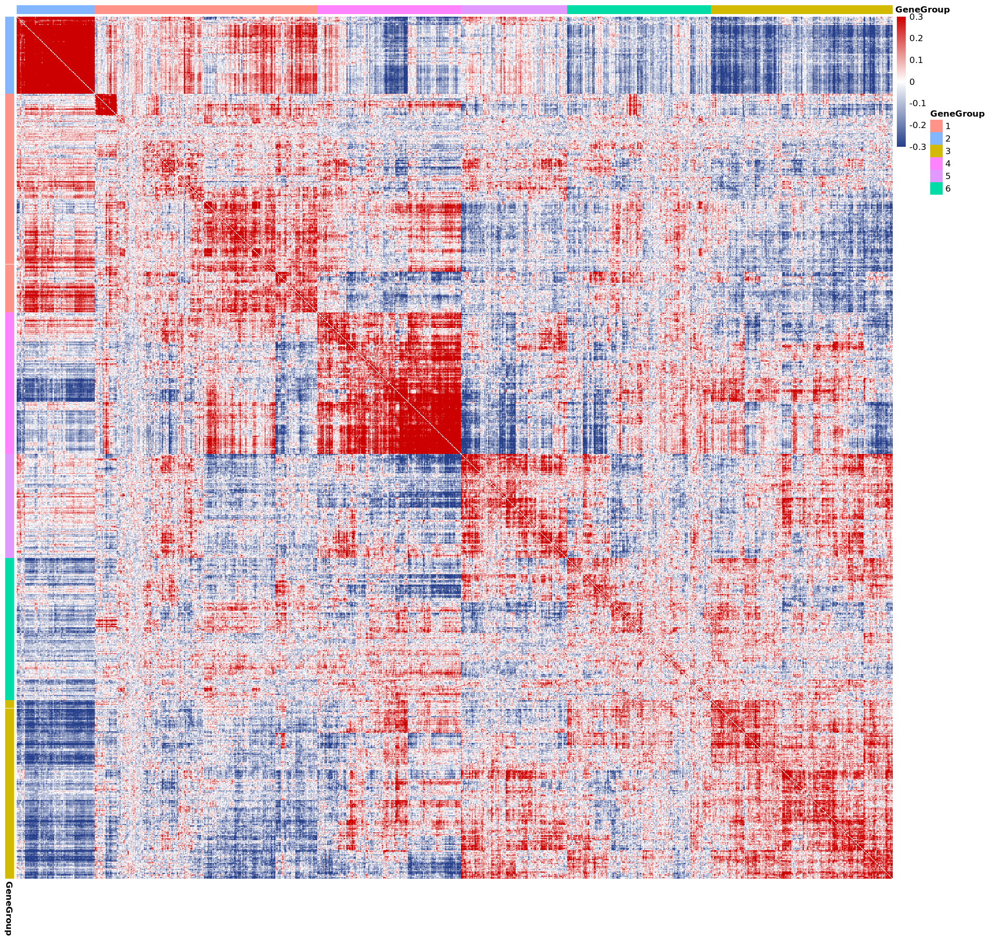

In [23]:
geneModulesN$GeneName <- NULL
geneModulesN$GeneGroup <- factor(geneModulesN$GeneGroup)
  
library(RColorBrewer)
#  n <- 11
#  qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
#  myColors=unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))[1:(n)]
#  names(myColors) <- as.character(unique(geneClusters[hm1$tree_row$order]))
#  col_vector = list(myCol=myColors)

 M1[M1>0.3] = 0.3
 M1[M1 < -0.3] = -0.3

options(repr.plot.width=16, repr.plot.height=15)

pheatmap(M1[rownames(geneModulesN), rownames(geneModulesN)],
         annotation_col = geneModulesN,
         annotation_row = geneModulesN,
        # annotation_colors = col_vector[1],
         show_rownames = FALSE, show_colnames = FALSE,
         treeheight_row = 0, treeheight_col = 0,
         cluster_rows = F, cluster_cols = F,
         color=colorRampPalette(c("royalblue4","white","red3"))(200),
         annotation_names_row = TRUE,
         annotation_names_col = TRUE,
         annotation_legend = TRUE
         )


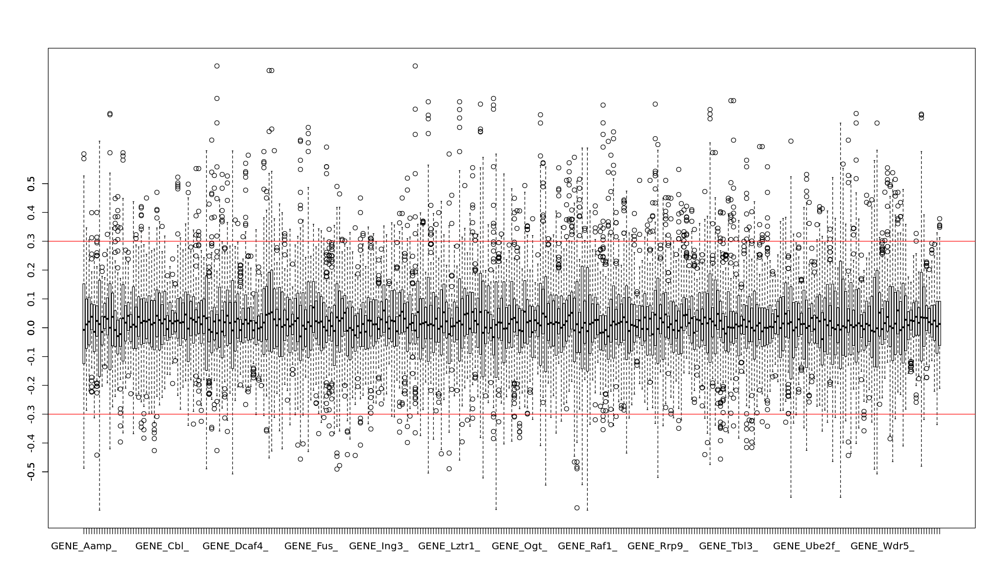

In [29]:
M_t = cor(t(coefsAll), method = "pearson")
diag(M_t) <- 0

options(repr.plot.width=17, repr.plot.height=10)

boxplot(M_t)
abline(h=0.3, col="red")
abline(h= -0.3, col="red")
axis(2, at = seq(-0.5,0.5,0.1))


In [30]:
M2 <- M_t
M2[M2>0.3] = 0.3
M2[M2 < -0.3] = -0.3

In [31]:
deneme <- prcomp(M2,rank. = 15)

In [32]:
summary(deneme)

Importance of first k=15 (out of 329) components:
                         PC1    PC2     PC3     PC4    PC5    PC6     PC7
Standard deviation     1.646 0.7383 0.54423 0.45940 0.3337 0.2744 0.23774
Proportion of Variance 0.601 0.1209 0.06571 0.04682 0.0247 0.0167 0.01254
Cumulative Proportion  0.601 0.7219 0.78761 0.83443 0.8591 0.8758 0.88837
                           PC8     PC9    PC10    PC11    PC12    PC13    PC14
Standard deviation     0.21900 0.18832 0.15329 0.13772 0.13354 0.12316 0.11088
Proportion of Variance 0.01064 0.00787 0.00521 0.00421 0.00396 0.00337 0.00273
Cumulative Proportion  0.89901 0.90688 0.91209 0.91630 0.92026 0.92362 0.92635
                          PC15
Standard deviation     0.10091
Proportion of Variance 0.00226
Cumulative Proportion  0.92861

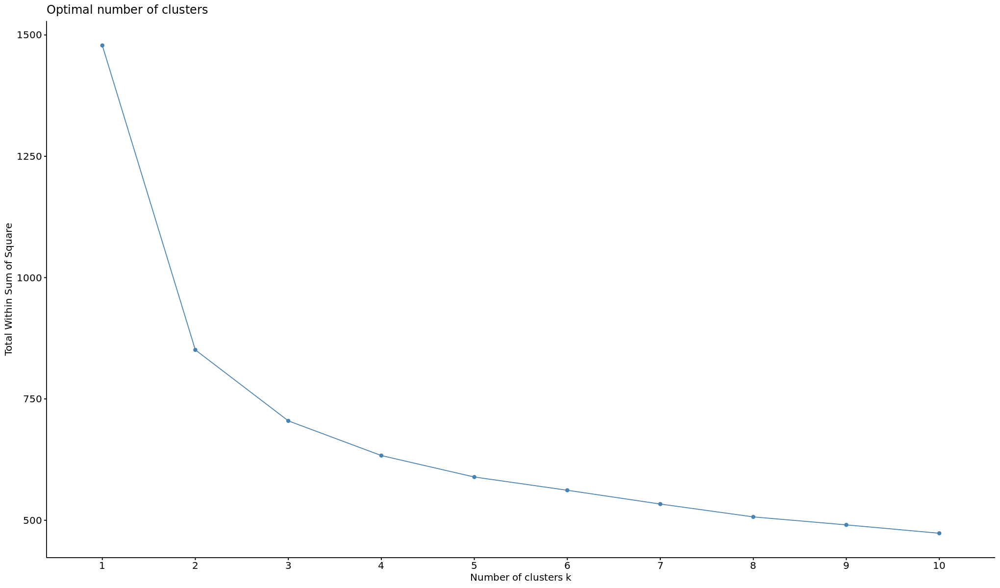

In [33]:
fviz_nbclust(M2, kmeans, method = "wss")


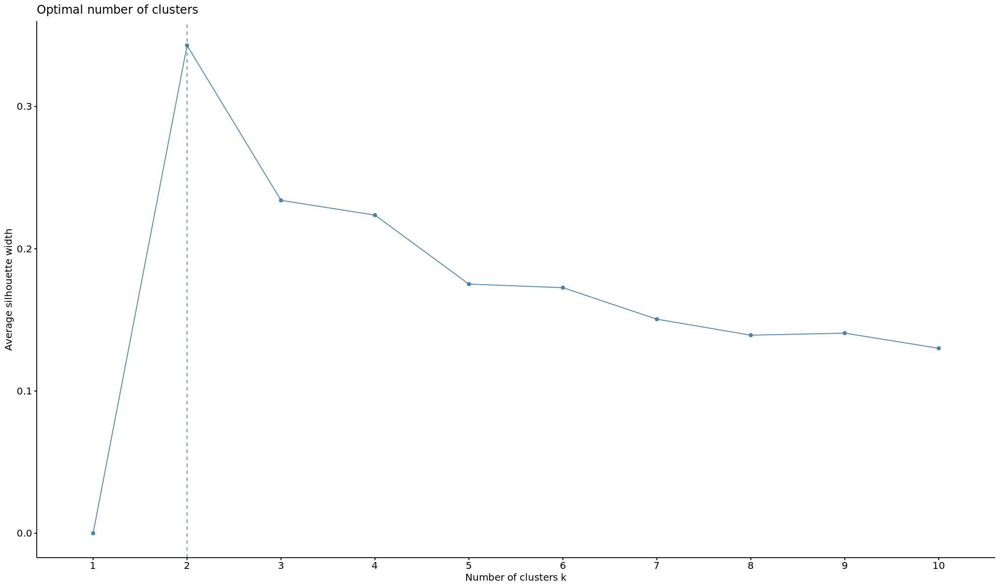

In [34]:
fviz_nbclust(M2, kmeans, method = "silhouette")


In [35]:
dim(M2)

[1] 329 329

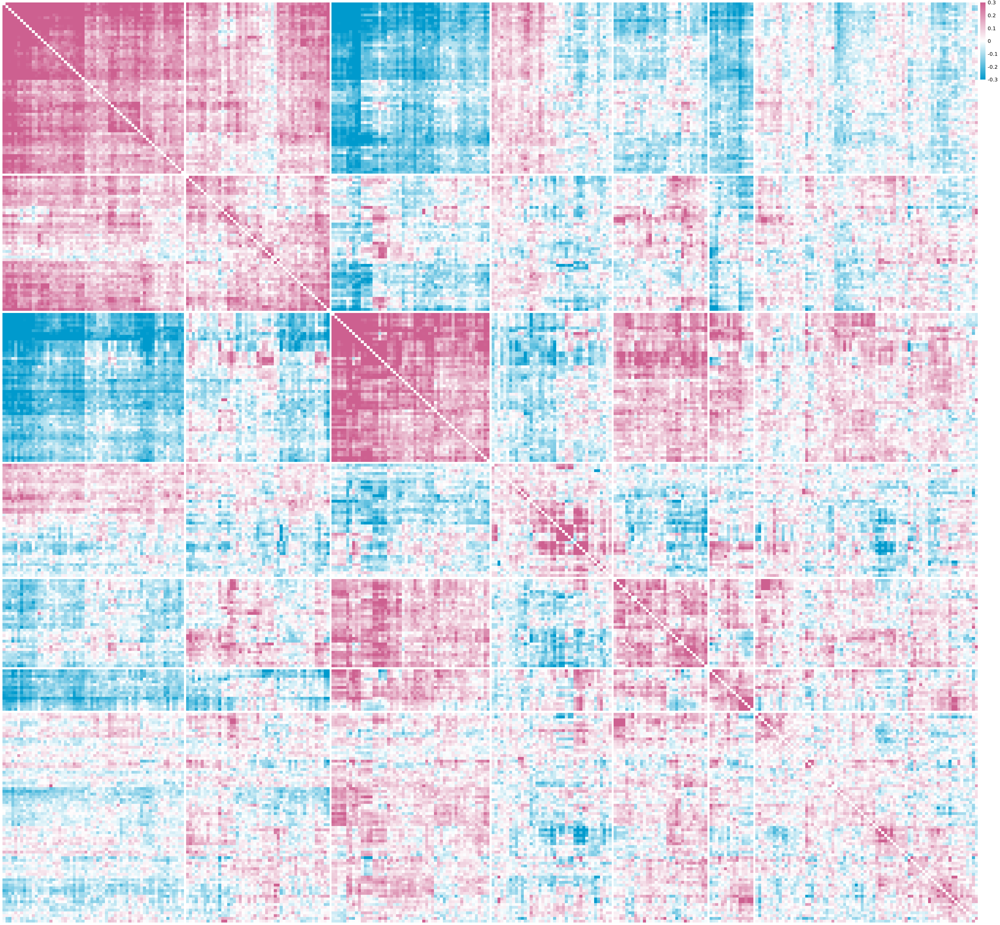

In [45]:
options(repr.plot.width=27, repr.plot.height=25)

hm2 <- pheatmap(M2,show_rownames = FALSE, show_colnames = FALSE, cutree_rows = 7, cutree_cols  = 7,
                treeheight_row = 0, treeheight_col = 0,
          color=colorRampPalette(c("deepskyblue3","white","hotpink3"))(200), clustering_method="ward.D2",
                 clustering_distance_rows="euclidean", clustering_distance_cols="euclidean")


In [ ]:
options(repr.plot.width=13, repr.plot.height=10)

ctree=9
plot(hm2$tree_row)
abline(h=ctree, col="red", lty=2, lwd=2)


In [47]:
guideClusters <- cutree(hm2$tree_ro, h=ctree)
length(unique(guideClusters))


[1] 7

In [48]:
table(guideClusters)
#guideClusters[hm2$tree_row$order]


guideClusters
 1  2  3  4  5  6  7 
62 54 76 49 41 15 32 

In [49]:
guideModules <- data.frame(GuideName=names(guideClusters[hm2$tree_row$order]),
                           GuideGroup=guideClusters[hm2$tree_row$order], stringsAsFactors = F)
rownames(guideModules) <- names(guideClusters[hm2$tree_row$order])


In [50]:
unique(guideModules$GuideGroup)

[1] 1 4 2 5 7 6 3

In [51]:
guideModulesN <- rbind(guideModules[guideModules$GuideGroup==1,], guideModules[guideModules$GuideGroup==4,] ) 
guideModulesN <- rbind(guideModulesN, guideModules[guideModules$GuideGroup==5,])
guideModulesN <- rbind(guideModulesN, guideModules[guideModules$GuideGroup==3,])
guideModulesN <- rbind(guideModulesN, guideModules[guideModules$GuideGroup==7,])
guideModulesN <- rbind(guideModulesN, guideModules[guideModules$GuideGroup==6,])
guideModulesN <- rbind(guideModulesN, guideModules[guideModules$GuideGroup==2,])

In [52]:
str(guideModulesN$GuideGroup)

 int [1:329] 1 1 1 1 1 1 1 1 1 1 ...


In [53]:
tp <- split(guideModulesN, f = guideModulesN$GuideGroup)

In [54]:
names(tp)

[1] "1" "2" "3" "4" "5" "6" "7"

In [56]:

tpDatGuide = data.frame(matrix("", nrow = max(table(guideClusters)), ncol=length(tp)), stringsAsFactors = FALSE)

for(elem in 1:length(tp)){
    tpDatGuide[1:length(tp[[elem]]$GuideName),elem] <- as.character(tp[[elem]]$GuideName)
}

colnames(tpDatGuide) <- paste0("GuideModule_",names(tp))

In [57]:
head(tpDatGuide)

,GuideModule_1,GuideModule_2,GuideModule_3,GuideModule_4,GuideModule_5,GuideModule_6,GuideModule_7
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,GENE_Rack1_,GENE_Tab1_,GENE_Ahctf1_,GENE_Naca_,GENE_Bach1_,GENE_Pten_,GENE_Cdc40_
2,GENE_Utp15_,GENE_Zbtb25_,GENE_Nup43_,GENE_Kctd13_,GENE_Fbxl5_,GENE_Kctd5_,GENE_Prpf19_
3,GENE_Wdr43_,GENE_Foxo3_,GENE_Snrnp40_,GENE_Fbxo11_,GENE_Vhl_,GENE_Lztr1_,GENE_Ddx41_
4,GENE_Raf1_,GENE_Klhl6_,GENE_Wdr70_,GENE_Zbtb14_,GENE_Siah2_,GENE_Smad2_,GENE_Plrg1_
5,GENE_Rrp9_,GENE_March6_,GENE_Ppwd1_,GENE_Mib1_,GENE_Cdc27_,GENE_Cbl_,GENE_Junb_
6,GENE_Uhrf1_,GENE_Crebbp_,GENE_Zbtb7a_,GENE_Cblc_,GENE_Wwp1_,GENE_Wdr33_,GENE_Kmt2c_


In [58]:
unique(guideModulesN$GuideGroup)

[1] 1 4 5 3 7 6 2

In [59]:
write.csv(guideModulesN, "/home/beraslan/jovian-work/analysisSingle/ME_GuideModules_7_Modules.csv", quote = F)
write.csv(tpDatGuide, "/home/beraslan/jovian-work/analysisSingle/ME_GuideModules_7_Modules_wide.csv", quote = F)


In [60]:
head(guideModulesN)

,GuideName,GuideGroup
,<chr>,<int>
GENE_Rack1_,GENE_Rack1_,1
GENE_Utp15_,GENE_Utp15_,1
GENE_Wdr43_,GENE_Wdr43_,1
GENE_Raf1_,GENE_Raf1_,1
GENE_Rrp9_,GENE_Rrp9_,1
GENE_Uhrf1_,GENE_Uhrf1_,1


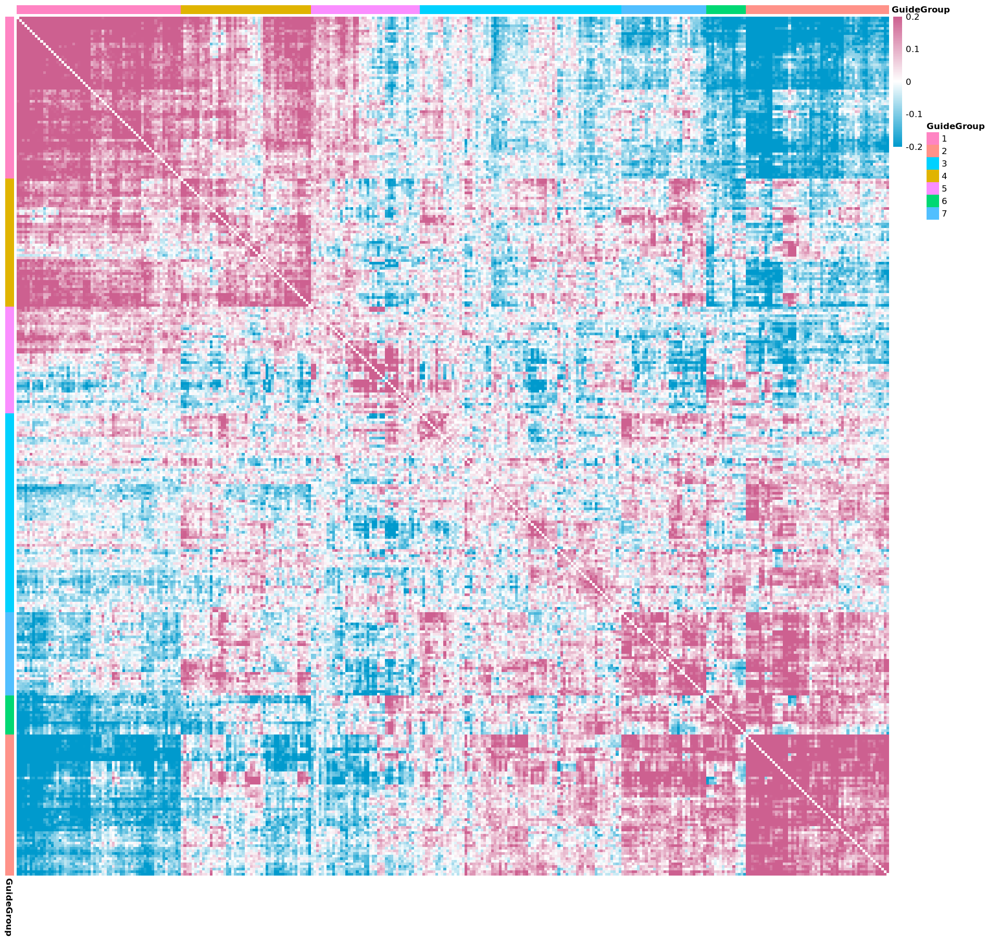

In [61]:
 library(RColorBrewer)
 guideModulesN$GuideName <- NULL
 guideModulesN$GuideGroup <- factor(guideModulesN$GuideGroup)
 n <- 7
#  qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
#  #myColors=unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))[1:(n)]
#  myColors = c("red", "green", "blue", "yellow","grey", "black")
#  names(myColors) <- as.character(unique(guideClusters[hm2$tree_row$order]))
#  col_vector = list(myCol=myColors)

 M2[M2>0.2] = 0.2
 M2[M2 < -0.2] = -0.2

options(repr.plot.width=16, repr.plot.height=15)

kk <- pheatmap(M2[rownames(guideModulesN), rownames(guideModulesN)],
         show_rownames = FALSE, show_colnames = FALSE,
         treeheight_row = 0, treeheight_col = 0,
         cluster_rows = F, cluster_cols = F,
         color=colorRampPalette(c("deepskyblue3","white","hotpink3"))(200),
         annotation_row = guideModulesN,annotation_col = guideModulesN,
         annotation_names_row = T, annotation_names_col = T, annotation_legend = T,
        # annotation_colors =col_vector
          )



In [62]:
length(unique(guideClusters[hm2$tree_row$order]))


[1] 7

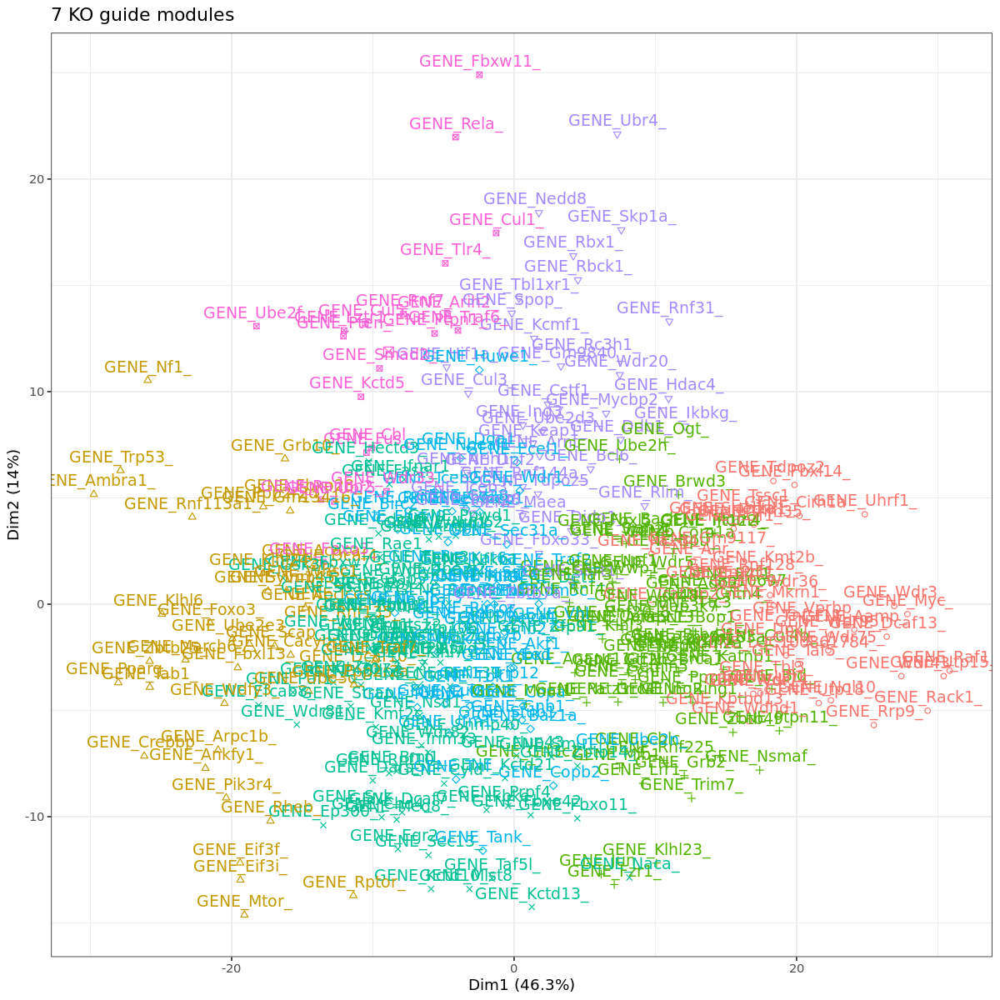

In [64]:
options(repr.plot.width=10, repr.plot.height=10)

hc.cut <- hcut(M_t, k = length(unique(guideClusters[hm2$tree_row$order])), hc_method = "ward.D2", hc_metric = "euclidean")
#fviz_dend(hc.cut, show_labels = TRUE, rect = TRUE)
fviz_cluster(hc.cut, data = M_t, ellipse = FALSE, main = "7 KO guide modules")+theme_bw()+theme(legend.position = "None")


In [65]:
head(geneModules)

,GeneName,GeneGroup
,<chr>,<fct>
Eef1a1,Eef1a1,2
Tpt1,Tpt1,2
Rps27,Rps27,2
Rplp0,Rplp0,2
Denr,Denr,2
Hmgb2,Hmgb2,2


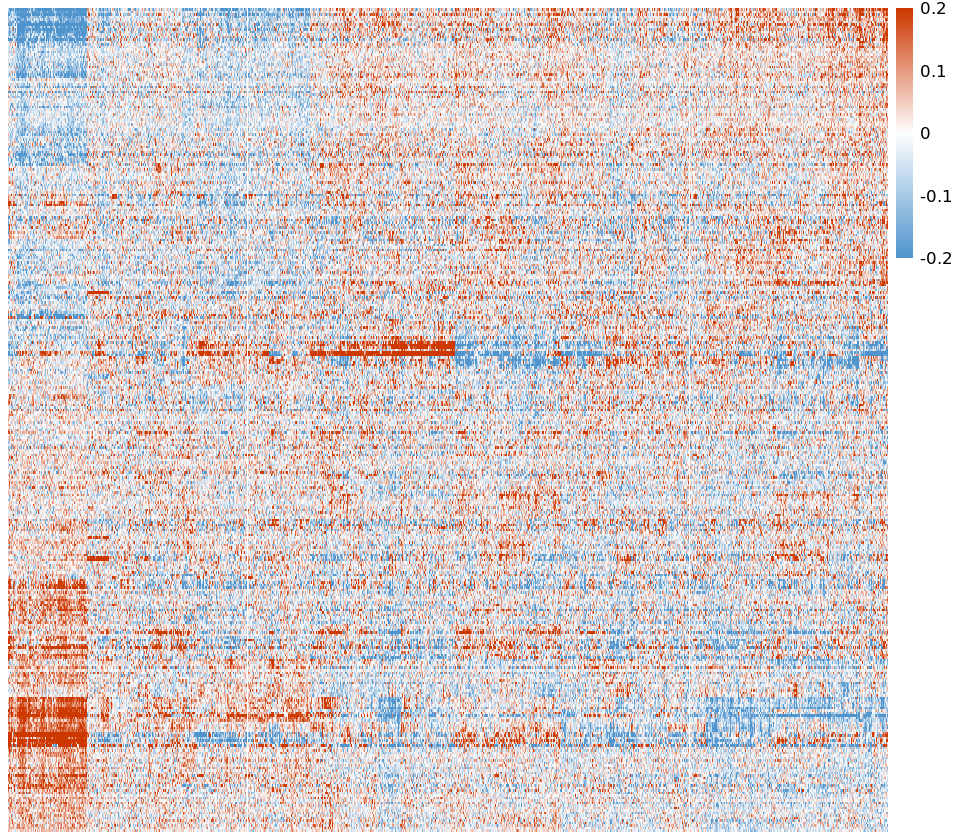

In [71]:
geneOrder = rownames(geneModulesN)
guideOrder= rownames(guideModulesN)

dene <- coefsAll[guideOrder,geneOrder]

options(repr.plot.width=8, repr.plot.height=7)
dene[dene>0.2] = 0.2
dene[dene < -0.2] = -0.2

pheatmap(dene, cluster_rows = F, cluster_cols = F,treeheight_row = 0, treeheight_col = 0,
          show_rownames = FALSE, show_colnames = FALSE,
         color=colorRampPalette(c("steelblue3","white","orangered3"))(200) )


In [72]:
write.csv(coefsAll[guideOrder,geneOrder], "/home/beraslan/jovian-work/analysisSingle/SignificantCoefMatrix.csv", quote=FALSE)